## Initialization, Libraries, and Main Configuration


### Library Imports


In [49]:
import os
import json
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from skimage.feature import graycomatrix, graycoprops
from tqdm import tqdm
import joblib
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.cluster import KMeans

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import ReduceLROnPlateau

### Path and Hyperparameter Configuration


In [50]:
RUN_ENV = "local"
PROJECT_ROOT = os.getcwd()

if RUN_ENV == "colab":
    from google.colab import drive
    drive.mount("/content/drive")
    
    BASE_DIR = "/content/dataset"
    IMAGE_DIR = os.path.join(BASE_DIR, "images")
    ANNOTATION_JSON = os.path.join(BASE_DIR, "dronewaste_v1.0.json")
    
    os.makedirs(BASE_DIR, exist_ok=True)
    !cp "/content/drive/MyDrive/Project_Soft_Computing/dronewaste_v1.0.json" "{BASE_DIR}/"
    !cp "/content/drive/MyDrive/Project_Soft_Computing/images.tar.gz" "{BASE_DIR}/"
    !tar -xf "{BASE_DIR}/images.tar.gz" -C "{BASE_DIR}"
else:
    BASE_DIR = PROJECT_ROOT
    IMAGE_DIR = os.path.join(BASE_DIR, "images")
    ANNOTATION_JSON = os.path.join(BASE_DIR, "dronewaste_v2.0.json")

OUTPUT_CSV_PATH = "dataset_fitur_sampah.csv"
MODEL_PATH = "model_anfis_sampah.pth"
SCALER_PATH = "scaler_params.pkl"

In [51]:
# Hyperparameters
GRID_SIZE = 256
GLCM_DISTANCES = [1]
GLCM_ANGLES = [0, np.pi/4, np.pi/2, 3*np.pi/4]

NUM_RULES = 9
NUM_CLASSES = 3
EPOCHS = 300
BATCH_SIZE = 256
LEARNING_RATE = 0.005
PATIENCE = 30

## Parsing COCO JSON & Binary Mask Generation


### COCO API Initialization


In [52]:
coco_api = COCO(ANNOTATION_JSON)
image_ids = coco_api.getImgIds()

print(f"Total gambar teranotasi: {len(image_ids)}")

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
Total gambar teranotasi: 1221


### Binary Mask Generator


In [53]:
def generate_binary_mask(image_id, coco):
    img_metadata = coco.loadImgs(image_id)[0]
    height = img_metadata['height']
    width = img_metadata['width']

    binary_mask = np.zeros((height, width), dtype=np.uint8)

    ann_ids = coco.getAnnIds(imgIds=image_id)
    annotations = coco.loadAnns(ann_ids)

    for ann in annotations:
        instance_mask = coco.annToMask(ann)
        binary_mask[instance_mask == 1] = 255

    return binary_mask


### Visual Sanity Check


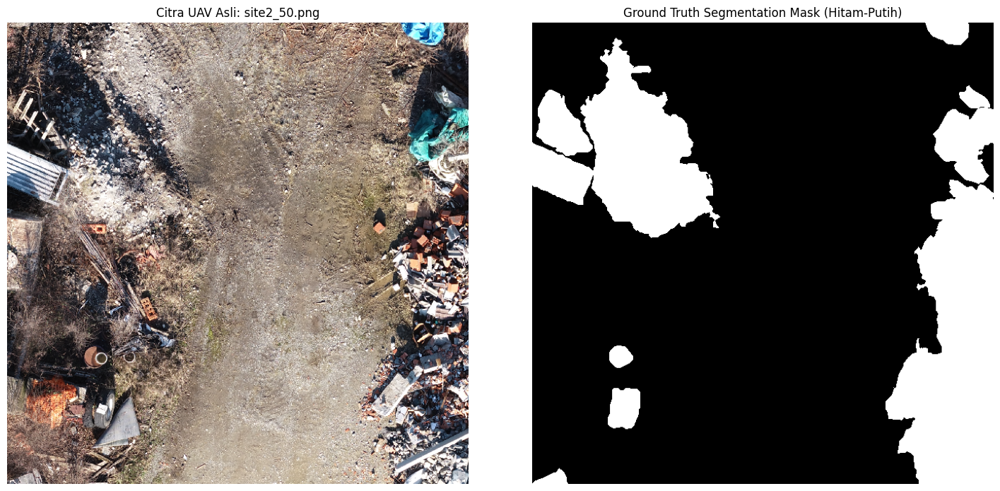

In [54]:
sample_img_filename = 'site2_50.png'
sample_img_id = None

for img_id_candidate, img_info in coco_api.imgs.items():
    if img_info['file_name'] == sample_img_filename:
        sample_img_id = img_id_candidate
        break

sample_metadata = coco_api.loadImgs(sample_img_id)[0]
sample_filename = sample_metadata['file_name']

img_path = os.path.join(IMAGE_DIR, sample_filename)
img_asli = cv2.imread(img_path)
img_asli = cv2.cvtColor(img_asli, cv2.COLOR_BGR2RGB)

masker_biner = generate_binary_mask(sample_img_id, coco_api)
fig, ax = plt.subplots(1, 2, figsize=(15, 7))

ax[0].imshow(img_asli)
ax[0].set_title(f"Citra UAV Asli: {sample_filename}")
ax[0].axis('off')

ax[1].imshow(masker_biner, cmap='gray')
ax[1].set_title("Ground Truth Segmentation Mask (Hitam-Putih)")
ax[1].axis('off')

plt.tight_layout()
plt.show()


## Grid Splitting and Feature Extraction


### Spatial Density Extractor


In [55]:
def hitung_kepadatan_spasial(mask_grid):
    """
    Menghitung persentase area sampah di dalam satu grid.
    Input: Potongan matriks gambar biner (hitam-putih) dari ground truth mask
    Output: Nilai float 0.0 (0%) hingga 1.0 (100%)
    """
    total_piksel = mask_grid.shape[0] * mask_grid.shape[1]
    piksel_putih = np.sum(mask_grid == 255) 
    kepadatan = piksel_putih / total_piksel

    return kepadatan


### GLCM Multi-Feature Texture Extractor (X1-X5)


In [56]:
def ekstrak_fitur_glcm(image_grid):
    """
    Mengekstrak 5 fitur tekstur dari GLCM (Gray-Level Co-occurrence Matrix).
    Setiap fitur dihitung per-sudut, lalu dirata-ratakan untuk merepresentasikan
    tekstur secara isotropik (tidak tergantung arah).

    Input: Potongan gambar RGB (numpy array HxWx3)
    Output: Dictionary berisi 5 nilai fitur GLCM
    """
    gray_grid = cv2.cvtColor(image_grid, cv2.COLOR_RGB2GRAY)

    glcm = graycomatrix(gray_grid, distances=GLCM_DISTANCES, angles=GLCM_ANGLES,
                        levels=256, symmetric=True, normed=True)

    contrast = graycoprops(glcm, 'contrast').mean()
    homogeneity = graycoprops(glcm, 'homogeneity').mean()
    energy = graycoprops(glcm, 'energy').mean()
    correlation = graycoprops(glcm, 'correlation').mean()

    n_angles = glcm.shape[3]
    entropies = []
    for angle_idx in range(n_angles):
        glcm_single = glcm[:, :, 0, angle_idx]
        glcm_nonzero = glcm_single[glcm_single > 0]
        entropy_val = -np.sum(glcm_nonzero * np.log2(glcm_nonzero))
        entropies.append(entropy_val)
    entropy = np.mean(entropies)

    return {
        'X1_Entropy': entropy,
        'X2_Contrast': contrast,
        'X3_Homogeneity': homogeneity,
        'X4_Energy': energy,
        'X5_Correlation': correlation
    }


### Excess Green Vegetation Index Extractor (X6)


In [57]:
def hitung_indeks_vegetasi_exg(image_grid):
    """
    Menghitung rata-rata nilai Excess Green (ExG) dari potongan gambar RGB.
    Tujuan: Membedakan tekstur kasar tumbuhan (tinggi) dengan tekstur kasar sampah (rendah).
    """
    grid_float = image_grid.astype(np.float32)

    R = grid_float[:, :, 0]
    G = grid_float[:, :, 1]
    B = grid_float[:, :, 2]

    matriks_exg = (2 * G) - R - B
    rata_rata_exg = np.mean(matriks_exg)

    return rata_rata_exg


### Vegetation Index Tambahan (X7-X8)

In [58]:
def hitung_indeks_exr_exgr(img_rgb):
    img = img_rgb.astype(np.float32)

    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Normalisasi RGB agar lebih stabil
    total = R + G + B + 1e-6
    r = R / total
    g = G / total
    b = B / total

    # Excess Green
    exg = 2 * g - r - b

    # Excess Red
    exr = 1.4 * r - g

    # Excess Green minus Excess Red
    exgr = exg - exr

    return np.mean(exr), np.mean(exgr)

### Main Grid Loop and CSV Export


In [59]:
import os
import pandas as pd

FORCE_REEXTRACT = False

if os.path.exists(OUTPUT_CSV_PATH) and not FORCE_REEXTRACT:
    print(f"Menemukan berkas fitur yang sudah ada di: {OUTPUT_CSV_PATH}")
    print("Melewati proses ekstraksi fitur dari citra citra untuk menghemat waktu.")
    df_fitur = pd.read_csv(OUTPUT_CSV_PATH)
else:
    dataset_fitur = []
    LIMIT_GAMBAR = None

    image_ids_to_process = image_ids[:LIMIT_GAMBAR] if LIMIT_GAMBAR else image_ids
    total_img = len(image_ids_to_process)

    print(f"Ekstraksi grid pada {total_img} gambar...")

    for i, img_id in enumerate(tqdm(image_ids_to_process, desc="Processing Images")):
        img_metadata = coco_api.loadImgs(img_id)[0]
        img_filename = img_metadata['file_name']
        img_path = os.path.join(IMAGE_DIR, img_filename)

        img_asli = cv2.imread(img_path)
        if img_asli is None:
            continue

        img_asli = cv2.cvtColor(img_asli, cv2.COLOR_BGR2RGB)
        mask_asli = generate_binary_mask(img_id, coco_api)
        tinggi_asli, lebar_asli, _ = img_asli.shape

        for y in range(0, tinggi_asli, GRID_SIZE):
            for x in range(0, lebar_asli, GRID_SIZE):

                grid_img = img_asli[y:y+GRID_SIZE, x:x+GRID_SIZE]
                grid_mask = mask_asli[y:y+GRID_SIZE, x:x+GRID_SIZE]

                if grid_img.shape[0] != GRID_SIZE or grid_img.shape[1] != GRID_SIZE:
                    continue

                # Fitur input
                glcm_features = ekstrak_fitur_glcm(grid_img)
                x6_vegetasi = hitung_indeks_vegetasi_exg(grid_img)
                exr_val, exgr_val = hitung_indeks_exr_exgr(grid_img)

                # Label target
                kepadatan = hitung_kepadatan_spasial(grid_mask)
                if kepadatan < 0.05:
                    y_target = 0    # Aman
                elif kepadatan <= 0.40:
                    y_target = 1    # Tersebar
                else:
                    y_target = 2    # Kritis

                grid_id = f"{img_filename}_X{x}_Y{y}"

                row = {
                    "Grid_ID": grid_id,
                    **glcm_features,
                    "X6_Indeks_ExG": x6_vegetasi,
                    "X7_Indeks_ExR": exr_val,
                    "X8_Indeks_ExGR": exgr_val,
                    "kepadatan": kepadatan,
                    "Y_Target": y_target
                }
                dataset_fitur.append(row)

    df_fitur = pd.DataFrame(dataset_fitur)
    df_fitur.to_csv(OUTPUT_CSV_PATH, index=False)
    print(f"Data disimpan ke: {OUTPUT_CSV_PATH}")

df_class_0 = df_fitur[df_fitur['Y_Target'] == 0]
df_class_1 = df_fitur[df_fitur['Y_Target'] == 1]
df_class_2 = df_fitur[df_fitur['Y_Target'] == 2]

print(f"Total grid: {len(df_fitur)} baris")
print(f"  Kelas 0 (Aman): {len(df_class_0)} baris")
print(f"  Kelas 1 (Tersebar): {len(df_class_1)} baris")
print(f"  Kelas 2 (Kritis): {len(df_class_2)} baris")

df_fitur.head()

Menemukan berkas fitur yang sudah ada di: dataset_fitur_sampah.csv
Melewati proses ekstraksi fitur dari citra citra untuk menghemat waktu.
Total grid: 4884 baris
  Kelas 0 (Aman): 2599 baris
  Kelas 1 (Tersebar): 1120 baris
  Kelas 2 (Kritis): 1165 baris


,Grid_ID,X1_Entropy,X2_Contrast,X3_Homogeneity,X4_Energy,X5_Correlation,X6_Indeks_ExG,X7_Indeks_ExR,X8_Indeks_ExGR,kepadatan,Y_Target
0,site3_26.png_X0_Y0,8.293796,93.319738,0.450448,0.333677,0.985878,29.150574,0.037333,0.060134,0.000000,0
1,site3_26.png_X256_Y0,6.882102,96.582034,0.578053,0.470953,0.989038,17.965103,0.045085,0.010130,0.000000,0
2,site3_26.png_X0_Y256,12.031336,168.458442,0.150140,0.020190,0.906933,28.492996,0.092095,0.000524,0.000000,0
3,site3_26.png_X256_Y256,11.247467,90.347422,0.205119,0.027277,0.949619,51.595642,0.017314,0.165983,0.018753,0
4,site3_56.png_X0_Y0,12.306058,228.082709,0.124363,0.017682,0.828131,61.038300,0.043936,0.161625,0.000000,0


## Training Data Management and Splitting


### Load Tabular Data and Distribution Analysis


Total data: 4884 baris
Kelas 0 (Aman/Bersih): 2599 (53.21%)
Kelas 1 (Sampah Tersebar Ringan): 1120 (22.93%)
Kelas 2 (Klaster Kritis): 1165 (23.85%)


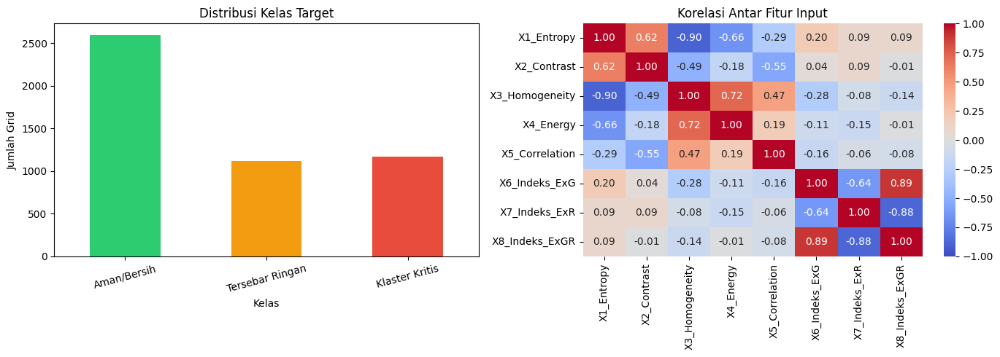

In [60]:
df_raw = pd.read_csv(OUTPUT_CSV_PATH)

print(f"Total data: {len(df_raw)} baris")

distribusi_kelas = df_raw['Y_Target'].value_counts().sort_index()
for kelas, jumlah in distribusi_kelas.items():
    nama_kelas = {0: "Aman/Bersih", 1: "Sampah Tersebar Ringan", 2: "Klaster Kritis"}[kelas]
    persentase = (jumlah / len(df_raw)) * 100
    print(f"Kelas {kelas} ({nama_kelas}): {jumlah} ({persentase:.2f}%)")

# Visualisasi
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

colors = ['#2ecc71', '#f39c12', '#e74c3c']
labels = ['Aman/Bersih', 'Tersebar Ringan', 'Klaster Kritis']

distribusi_kelas.plot(kind='bar', ax=axes[0], color=colors)
axes[0].set_title('Distribusi Kelas Target')
axes[0].set_xlabel('Kelas')
axes[0].set_ylabel('Jumlah Grid')
axes[0].set_xticklabels(labels, rotation=15)

feature_cols = [
    'X1_Entropy',
    'X2_Contrast',
    'X3_Homogeneity',
    'X4_Energy',
    'X5_Correlation',
    'X6_Indeks_ExG',
    'X7_Indeks_ExR',
    'X8_Indeks_ExGR'
]

corr_matrix = df_raw[feature_cols].corr()
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', ax=axes[1], vmin=-1, vmax=1)
axes[1].set_title('Korelasi Antar Fitur Input')

plt.tight_layout()
plt.show()

### Feature Scaling (Min-Max Normalization)


In [61]:
FEATURE_COLUMNS = ['X1_Entropy', 'X2_Contrast', 'X3_Homogeneity', 
                   'X4_Energy', 'X5_Correlation', 'X6_Indeks_ExG', 
                   'X7_Indeks_ExR', 'X8_Indeks_ExGR']

df_normalized = df_raw.copy()
scaler_params = {}


for col in FEATURE_COLUMNS:
    col_min = df_raw[col].min()
    col_max = df_raw[col].max()

    scaler_params[col] = {'min': float(col_min), 'max': float(col_max)}

    if col_max != col_min:
        df_normalized[col] = (df_raw[col] - col_min) / (col_max - col_min)
    else:
        df_normalized[col] = 0.0

    print(f"{col}: [{col_min:.4f}, {col_max:.4f}] -> [0, 1]")

joblib.dump(scaler_params, SCALER_PATH)
df_normalized[FEATURE_COLUMNS + ['Y_Target']].describe()

X1_Entropy: [0.1052, 15.0427] -> [0, 1]
X2_Contrast: [0.7303, 3870.6683] -> [0, 1]
X3_Homogeneity: [0.0219, 0.9950] -> [0, 1]
X4_Energy: [0.0059, 0.9940] -> [0, 1]
X5_Correlation: [0.2114, 0.9931] -> [0, 1]
X6_Indeks_ExG: [-70.4493, 142.2118] -> [0, 1]
X7_Indeks_ExR: [-0.0851, 0.4877] -> [0, 1]
X8_Indeks_ExGR: [-0.7805, 0.5550] -> [0, 1]


,X1_Entropy,X2_Contrast,X3_Homogeneity,X4_Energy,X5_Correlation,X6_Indeks_ExG,X7_Indeks_ExR,X8_Indeks_ExGR,Y_Target
count,4884.000000,4884.000000,4884.000000,4884.000000,4884.000000,4884.000000,4884.000000,4884.000000,4884.000000
mean,0.831404,0.134530,0.132437,0.023751,0.804938,0.387590,0.372885,0.523737,0.706388
std,0.098113,0.124058,0.104167,0.057464,0.162158,0.097993,0.084877,0.094963,0.827413
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.792947,0.052628,0.064363,0.006082,0.728633,0.323520,0.333096,0.468993,0.000000
50%,0.851934,0.094506,0.103111,0.010239,0.854838,0.355161,0.385923,0.494353,0.000000
75%,0.895108,0.173880,0.173662,0.020983,0.925947,0.414364,0.422338,0.545878,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000


## ANFIS Modeling and Training


### Train-Validation-Test Split


In [62]:
NUM_FEATURES = len(FEATURE_COLUMNS)

X = df_normalized[FEATURE_COLUMNS].values
Y = df_normalized['Y_Target'].values

X_trainval, X_test, Y_trainval, Y_test = train_test_split(
    X, Y, test_size=0.20, random_state=42, stratify=Y
)

X_train, X_val, Y_train, Y_val = train_test_split(
    X_trainval, Y_trainval, test_size=0.15, random_state=42, stratify=Y_trainval
)

print(f"Train: {X_train.shape[0]} | Val: {X_val.shape[0]} | Test: {X_test.shape[0]} | Features: {NUM_FEATURES}")

Train: 3320 | Val: 587 | Test: 977 | Features: 8


### ANFIS Architecture Definition (PyTorch)


In [63]:
class ANFIS(nn.Module):
    """
    Adaptive Neuro-Fuzzy Inference System (ANFIS) - Arsitektur Takagi-Sugeno-Kang (TSK) Order 1.
    """
    def __init__(self, num_inputs, num_rules, num_classes):
        super(ANFIS, self).__init__()
        self.num_inputs = num_inputs
        self.num_rules = num_rules
        self.num_classes = num_classes

        # Layer 1: Gaussian MF
        self.mu = nn.Parameter(torch.randn(num_rules, num_inputs))
        self.sigma_raw = nn.Parameter(torch.ones(num_rules, num_inputs) * 0.5)

        # Layer 4: Konsekuen TSK
        self.consequent_weights = nn.Parameter(torch.randn(num_rules, num_inputs) * 0.1)
        self.consequent_bias = nn.Parameter(torch.zeros(num_rules))

        # Layer Klasifikasi
        self.classifier = nn.Linear(num_rules, num_classes)

    @property
    def sigma(self):
        """Sigma selalu positif via softplus transformation."""
        return F.softplus(self.sigma_raw) + 1e-6

    def init_from_kmeans(self, X_train):
        """
        Inisialisasi centroid (mu) dan spread (sigma) menggunakan KMeans clustering.
        Ini memberikan titik awal yang jauh lebih baik daripada random initialization.
        """
        kmeans = KMeans(n_clusters=self.num_rules, random_state=42, n_init=10)
        kmeans.fit(X_train)

        # Set mu & sigma
        self.mu.data = torch.tensor(kmeans.cluster_centers_, dtype=torch.float32)

        labels = kmeans.labels_
        sigma_init = torch.ones(self.num_rules, self.num_inputs) * 0.3
        for i in range(self.num_rules):
            cluster_data = X_train[labels == i]
            if len(cluster_data) > 1:
                std_vals = np.std(cluster_data, axis=0)
                std_vals = np.maximum(std_vals, 0.05)
                sigma_init[i] = torch.tensor(std_vals, dtype=torch.float32)

        self.sigma_raw.data = torch.log(torch.exp(sigma_init) - 1 + 1e-6)

        print(f"MF diinisialisasi dari KMeans ({self.num_rules} clusters)")

    def forward(self, x):
        batch_size = x.shape[0]

        # Layer 1: Fuzzifikasi
        x_expanded = x.unsqueeze(1).expand(-1, self.num_rules, -1)
        sigma = self.sigma
        mf_out = torch.exp(-0.5 * ((x_expanded - self.mu) / sigma) ** 2)

        # Layer 2: Rule Firing
        firing_strength = torch.prod(mf_out, dim=2)

        # Layer 3: Normalisasi
        normalizer = torch.sum(firing_strength, dim=1, keepdim=True) + 1e-8
        normalized_firing = firing_strength / normalizer

        # Layer 4: Konsekuen TSK
        consequent = torch.sum(x_expanded * self.consequent_weights, dim=2) + self.consequent_bias

        # Layer 5: Defuzzifikasi & Klasifikasi
        weighted_output = normalized_firing * consequent 

        class_logits = self.classifier(weighted_output)

        return class_logits, normalized_firing


### Model Initialization


In [64]:
# 1. Tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
Y_train_tensor = torch.tensor(Y_train, dtype=torch.long)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.long)

X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
Y_test_tensor = torch.tensor(Y_test, dtype=torch.long)

# 2. Initialize Model
anfis_model = ANFIS(num_inputs=NUM_FEATURES, num_rules=NUM_RULES, num_classes=NUM_CLASSES)

# 3. Initialize MF
anfis_model.init_from_kmeans(X_train)

# 4. Class Weights
class_counts = np.bincount(Y_train)
total_samples = len(Y_train)
class_weights = torch.tensor(
    [total_samples / (NUM_CLASSES * count) for count in class_counts],
    dtype=torch.float32
)
print("Class weights:")
for i, (w, c) in enumerate(zip(class_weights, class_counts)):
    nama = {0: "Aman", 1: "Tersebar", 2: "Kritis"}[i]
    print(f"  Kelas {i} ({nama}): weight={w:.4f}")

# 5. Loss & Optimizer
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(anfis_model.parameters(), lr=LEARNING_RATE)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=10)

# 6. DataLoader
train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

MF diinisialisasi dari KMeans (9 clusters)
Class weights:
  Kelas 0 (Aman): weight=0.6263
  Kelas 1 (Tersebar): weight=1.4542
  Kelas 2 (Kritis): weight=1.3973


### Neuro-Fuzzy Training Loop


In [65]:
train_loss_history = []
val_loss_history = []
train_acc_history = []
val_acc_history = []

best_val_loss = float('inf')
best_model_state = None
patience_counter = 0

print(f"Training ANFIS ({EPOCHS} epochs)...")

for epoch in range(EPOCHS):
    # TRAINING PHASE
    anfis_model.train()
    epoch_train_loss = 0.0
    epoch_train_correct = 0
    epoch_train_total = 0

    for batch_X, batch_Y in train_loader:
        logits, _ = anfis_model(batch_X)
        loss = criterion(logits, batch_Y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_train_loss += loss.item() * batch_X.size(0)
        preds = torch.argmax(logits, dim=1)
        epoch_train_correct += (preds == batch_Y).sum().item()
        epoch_train_total += batch_X.size(0)

    avg_train_loss = epoch_train_loss / epoch_train_total
    train_accuracy = epoch_train_correct / epoch_train_total
    train_loss_history.append(avg_train_loss)
    train_acc_history.append(train_accuracy)

    # VALIDATION PHASE
    anfis_model.eval()
    with torch.no_grad():
        val_logits, _ = anfis_model(X_val_tensor)
        val_loss = criterion(val_logits, Y_val_tensor).item()
        val_preds = torch.argmax(val_logits, dim=1)
        val_accuracy = (val_preds == Y_val_tensor).float().mean().item()

    val_loss_history.append(val_loss)
    val_acc_history.append(val_accuracy)

    # LR Scheduler
    scheduler.step(val_loss)

    # EARLY STOPPING CHECK
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_state = {k: v.clone() for k, v in anfis_model.state_dict().items()}
        patience_counter = 0
    else:
        patience_counter += 1

    if (epoch + 1) % 50 == 0 or patience_counter == 0:
        print(f"Epoch {epoch+1:03d} | Train Loss: {avg_train_loss:.4f} | Val Loss: {val_loss:.4f}")

    if patience_counter >= PATIENCE:
        print(f"Early stopping at epoch {epoch+1}")
        break

# Restore Best Model
if best_model_state is not None:
    anfis_model.load_state_dict(best_model_state)

print(f"Selesai. Best Val Loss: {best_val_loss:.4f} (Epochs: {epoch+1})")

Training ANFIS (300 epochs)...
Epoch 001 | Train Loss: 1.0979 | Val Loss: 1.0778
Epoch 002 | Train Loss: 1.0533 | Val Loss: 1.0294
Epoch 003 | Train Loss: 0.9887 | Val Loss: 0.9795
Epoch 004 | Train Loss: 0.9249 | Val Loss: 0.9336
Epoch 005 | Train Loss: 0.8739 | Val Loss: 0.8981
Epoch 006 | Train Loss: 0.8377 | Val Loss: 0.8731
Epoch 007 | Train Loss: 0.8231 | Val Loss: 0.8685
Epoch 008 | Train Loss: 0.8116 | Val Loss: 0.8436
Epoch 011 | Train Loss: 0.7871 | Val Loss: 0.8393
Epoch 012 | Train Loss: 0.7843 | Val Loss: 0.8315
Epoch 013 | Train Loss: 0.7862 | Val Loss: 0.8261
Epoch 015 | Train Loss: 0.7783 | Val Loss: 0.8204
Epoch 017 | Train Loss: 0.7667 | Val Loss: 0.8085
Epoch 018 | Train Loss: 0.7688 | Val Loss: 0.8062
Epoch 019 | Train Loss: 0.7634 | Val Loss: 0.7960
Epoch 020 | Train Loss: 0.7587 | Val Loss: 0.7957
Epoch 022 | Train Loss: 0.7562 | Val Loss: 0.7923
Epoch 023 | Train Loss: 0.7551 | Val Loss: 0.7908
Epoch 024 | Train Loss: 0.7542 | Val Loss: 0.7832
Epoch 027 | Train L

### Performance Evaluation and Visualization


Test Loss: 0.7625 | Akurasi: 66.94%


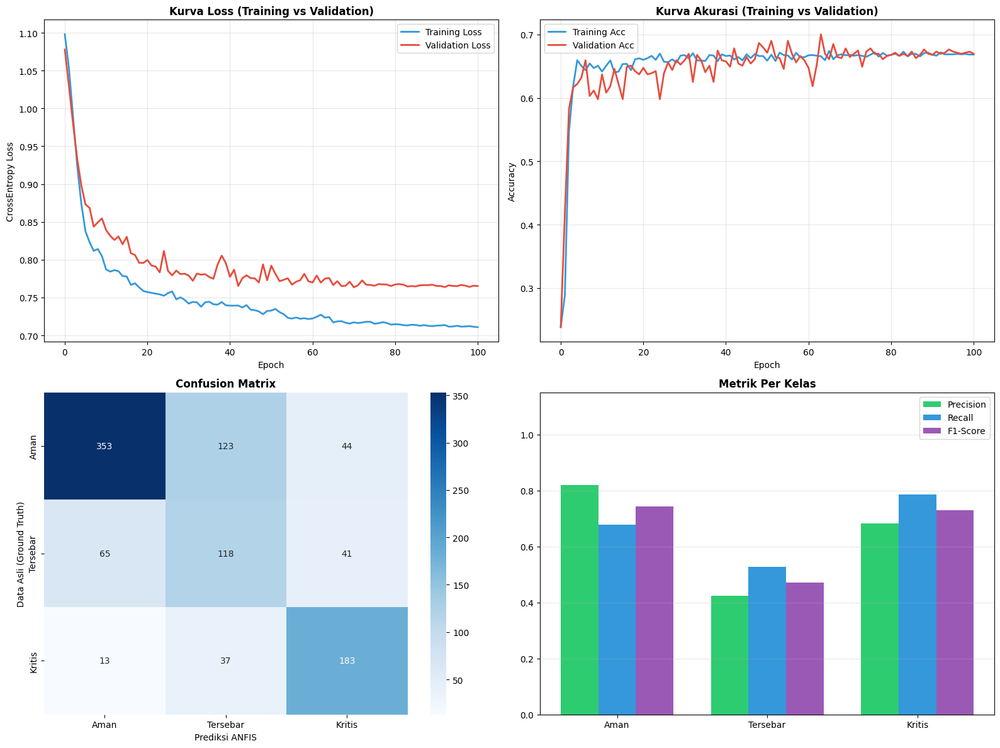

              precision    recall  f1-score   support

        Aman       0.82      0.68      0.74       520
    Tersebar       0.42      0.53      0.47       224
      Kritis       0.68      0.79      0.73       233

    accuracy                           0.67       977
   macro avg       0.64      0.66      0.65       977
weighted avg       0.70      0.67      0.68       977



In [66]:
anfis_model.eval()

with torch.no_grad():
    test_logits, test_firing = anfis_model(X_test_tensor)
    test_loss = criterion(test_logits, Y_test_tensor)
    y_pred_classes = torch.argmax(test_logits, dim=1).numpy()
    y_true_classes = Y_test_tensor.numpy()

test_accuracy = accuracy_score(y_true_classes, y_pred_classes)

print(f"Test Loss: {test_loss.item():.4f} | Akurasi: {test_accuracy*100:.2f}%")

# Visualisasi
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

axes[0, 0].plot(train_loss_history, label='Training Loss', color='#3498db', linewidth=2)
axes[0, 0].plot(val_loss_history, label='Validation Loss', color='#e74c3c', linewidth=2)
axes[0, 0].set_title("Kurva Loss (Training vs Validation)", fontweight='bold')
axes[0, 0].set_xlabel("Epoch")
axes[0, 0].set_ylabel("CrossEntropy Loss")
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].plot(train_acc_history, label='Training Acc', color='#3498db', linewidth=2)
axes[0, 1].plot(val_acc_history, label='Validation Acc', color='#e74c3c', linewidth=2)
axes[0, 1].set_title("Kurva Akurasi (Training vs Validation)", fontweight='bold')
axes[0, 1].set_xlabel("Epoch")
axes[0, 1].set_ylabel("Accuracy")
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

cm = confusion_matrix(y_true_classes, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[1, 0],
            xticklabels=['Aman', 'Tersebar', 'Kritis'],
            yticklabels=['Aman', 'Tersebar', 'Kritis'])
axes[1, 0].set_title("Confusion Matrix", fontweight='bold')
axes[1, 0].set_xlabel("Prediksi ANFIS")
axes[1, 0].set_ylabel("Data Asli (Ground Truth)")

report = classification_report(y_true_classes, y_pred_classes,
                               target_names=['Aman', 'Tersebar', 'Kritis'],
                               output_dict=True)
class_names = ['Aman', 'Tersebar', 'Kritis']
precisions = [report[c]['precision'] for c in class_names]
recalls = [report[c]['recall'] for c in class_names]
f1_scores = [report[c]['f1-score'] for c in class_names]

x_pos = np.arange(len(class_names))
width = 0.25
axes[1, 1].bar(x_pos - width, precisions, width, label='Precision', color='#2ecc71')
axes[1, 1].bar(x_pos, recalls, width, label='Recall', color='#3498db')
axes[1, 1].bar(x_pos + width, f1_scores, width, label='F1-Score', color='#9b59b6')
axes[1, 1].set_xticks(x_pos)
axes[1, 1].set_xticklabels(class_names)
axes[1, 1].set_ylim(0, 1.15)
axes[1, 1].set_title("Metrik Per Kelas", fontweight='bold')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Classification Report
print(classification_report(y_true_classes, y_pred_classes,
                            target_names=['Aman', 'Tersebar', 'Kritis']))


### Membership Function Visualization


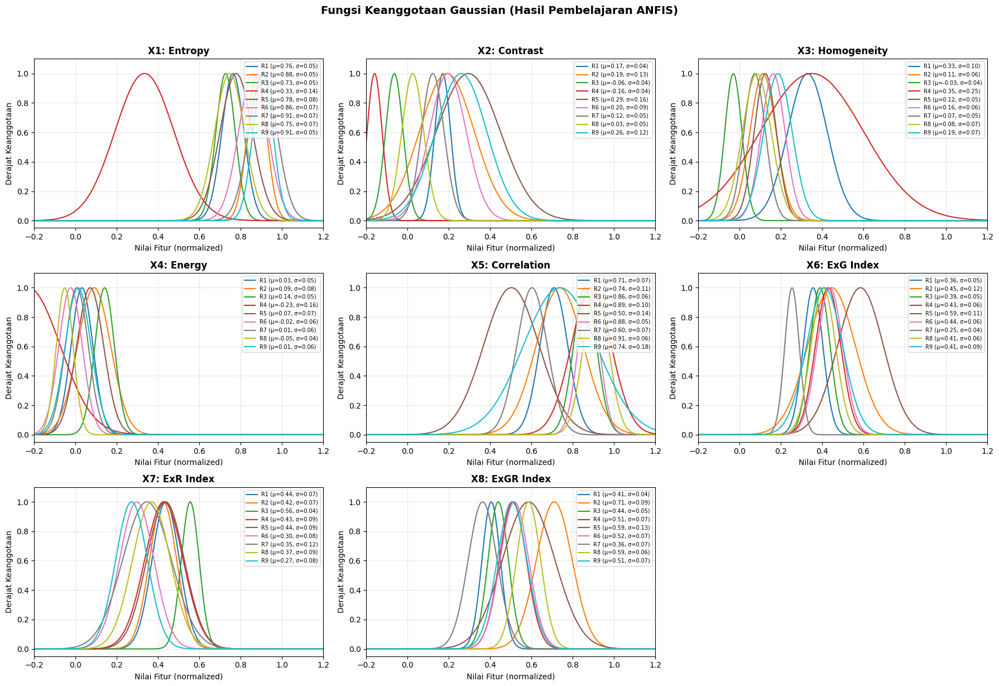

In [67]:
def plot_membership_functions(model, feature_names):
    """
    Visualisasi Gaussian Membership Functions yang telah dipelajari ANFIS.
    Menunjukkan bagaimana setiap rule 'memandang' setiap fitur input.
    """
    mu = model.mu.detach().numpy()
    sigma = model.sigma.detach().numpy()

    n_features = model.num_inputs
    n_rules = model.num_rules

    cols = 3
    rows = (n_features + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 4*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)

    colors = plt.cm.tab10(np.linspace(0, 1, n_rules))

    for feat_idx in range(n_features):
        ax = axes[feat_idx // cols, feat_idx % cols]
        x_range = np.linspace(-0.2, 1.2, 300)

        for rule_idx in range(n_rules):
            c = mu[rule_idx, feat_idx]
            s = sigma[rule_idx, feat_idx]
            mf_values = np.exp(-0.5 * ((x_range - c) / s) ** 2)
            ax.plot(x_range, mf_values, color=colors[rule_idx],
                    label=f'R{rule_idx+1} (μ={c:.2f}, σ={s:.2f})', linewidth=1.5)

        ax.set_title(f'{feature_names[feat_idx]}', fontweight='bold')
        ax.set_xlabel('Nilai Fitur (normalized)')
        ax.set_ylabel('Derajat Keanggotaan')
        ax.set_xlim(-0.2, 1.2)
        ax.set_ylim(-0.05, 1.1)
        ax.legend(fontsize=7, loc='upper right')
        ax.grid(True, alpha=0.3)

    # Hide unused subplots
    for idx in range(n_features, rows * cols):
        axes[idx // cols, idx % cols].set_visible(False)

    plt.suptitle('Fungsi Keanggotaan Gaussian (Hasil Pembelajaran ANFIS)',
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

feature_names = ['X1: Entropy', 'X2: Contrast', 'X3: Homogeneity',
                 'X4: Energy', 'X5: Correlation', 'X6: ExG Index', 
                 'X7: ExR Index', 'X8: ExGR Index']

plot_membership_functions(anfis_model, feature_names)


### Save Model Weights and Scaler


In [68]:
# Simpan model weights
save_dict = {
    'model_state_dict': anfis_model.state_dict(),
    'num_inputs': NUM_FEATURES,
    'num_rules': NUM_RULES,
    'num_classes': NUM_CLASSES,
    'feature_columns': FEATURE_COLUMNS,
    'scaler_params': scaler_params,
    'best_val_loss': best_val_loss,
}
torch.save(save_dict, MODEL_PATH)

print(f"Model disimpan ke: {MODEL_PATH}")
print(f"Scaler disimpan ke: {SCALER_PATH}")


Model disimpan ke: model_anfis_sampah.pth
Scaler disimpan ke: scaler_params.pkl


## Final Decision Map Testing (Inference and Heatmap)


### Load Model


In [69]:
# Load model
checkpoint = torch.load(MODEL_PATH, map_location="cpu")

loaded_anfis = ANFIS(
    num_inputs=checkpoint['num_inputs'],
    num_rules=checkpoint['num_rules'],
    num_classes=checkpoint['num_classes']
)
loaded_anfis.load_state_dict(checkpoint['model_state_dict'])
loaded_anfis.eval()

# Load scaler
loaded_scaler = checkpoint['scaler_params']

print(f"Model dimuat dari: {MODEL_PATH} ({checkpoint['num_inputs']} inputs, {checkpoint['num_rules']} rules)")


Model dimuat dari: model_anfis_sampah.pth (8 inputs, 9 rules)


### Heatmap Reconstruction Function


In [70]:
def normalize_features(features_dict, scaler):
    """Normalisasi fitur menggunakan parameter scaler yang tersimpan."""
    normalized = {}
    for key, value in features_dict.items():
        if key in scaler:
            min_val = scaler[key]['min']
            max_val = scaler[key]['max']
            if max_val != min_val:
                normalized[key] = (value - min_val) / (max_val - min_val)
            else:
                normalized[key] = 0.0
        else:
            normalized[key] = value
    return normalized

def buat_peta_panas_anfis(img_rgb, model, scaler, grid_size=128):
    """
    Membuat heatmap prediksi ANFIS pada gambar RGB.

    PERBAIKAN: Menggunakan model ANFIS yang sudah dilatih untuk inferensi,
    BUKAN ground truth mask atau rumus heuristik.

    Warna: Biru=Aman, Kuning=Tersebar, Merah=Kritis
    """
    tinggi, lebar, _ = img_rgb.shape
    overlay = img_rgb.copy()
    heat_map = np.zeros_like(img_rgb, dtype=np.uint8)
    prediction_map = np.full((tinggi // grid_size + 1, lebar // grid_size + 1), -1, dtype=int)

    model.eval()

    for y_idx, y in enumerate(range(0, tinggi, grid_size)):
        for x_idx, x in enumerate(range(0, lebar, grid_size)):
            grid_img = img_rgb[y:y+grid_size, x:x+grid_size]
            if grid_img.shape[0] != grid_size or grid_img.shape[1] != grid_size:
                continue

            # 1. Ekstrak fitur
            glcm_feats = ekstrak_fitur_glcm(grid_img)
            exg_val = hitung_indeks_vegetasi_exg(grid_img)
            exr_val, exgr_val = hitung_indeks_exr_exgr(grid_img)

            raw_features = {**glcm_feats, 'X6_Indeks_ExG': exg_val, 'X7_Indeks_ExR': exr_val, 'X8_Indeks_ExGR': exgr_val}

            # 2. Normalisasi
            norm_features = normalize_features(raw_features, scaler)

            # 3. Prediksi
            input_tensor = torch.tensor(
                [[norm_features[col] for col in FEATURE_COLUMNS]],
                dtype=torch.float32
            )

            with torch.no_grad():
                logits, _ = model(input_tensor)
                probabilities = F.softmax(logits, dim=1)
                predicted_class = torch.argmax(logits, dim=1).item()

            prediction_map[y_idx, x_idx] = predicted_class

            # 4. Warna visualisasi
            prob_tersebar = probabilities[0, 1].item()
            prob_kritis = probabilities[0, 2].item()

            heat_score = prob_tersebar * 0.5 + prob_kritis * 1.0
            heat_value = int(np.clip(heat_score, 0.0, 1.0) * 255)

            color = cv2.applyColorMap(np.array([[heat_value]], dtype=np.uint8), cv2.COLORMAP_JET)[0, 0]
            color_rgb = color[::-1]

            heat_map[y:y+grid_size, x:x+grid_size] = color_rgb
            cv2.rectangle(overlay, (x, y), (x + grid_size, y + grid_size),
                         tuple(int(c) for c in color_rgb), 1)

    img_heatmap = cv2.addWeighted(overlay, 0.35, heat_map, 0.65, 0)
    return img_heatmap, prediction_map



### Final Results Visualization


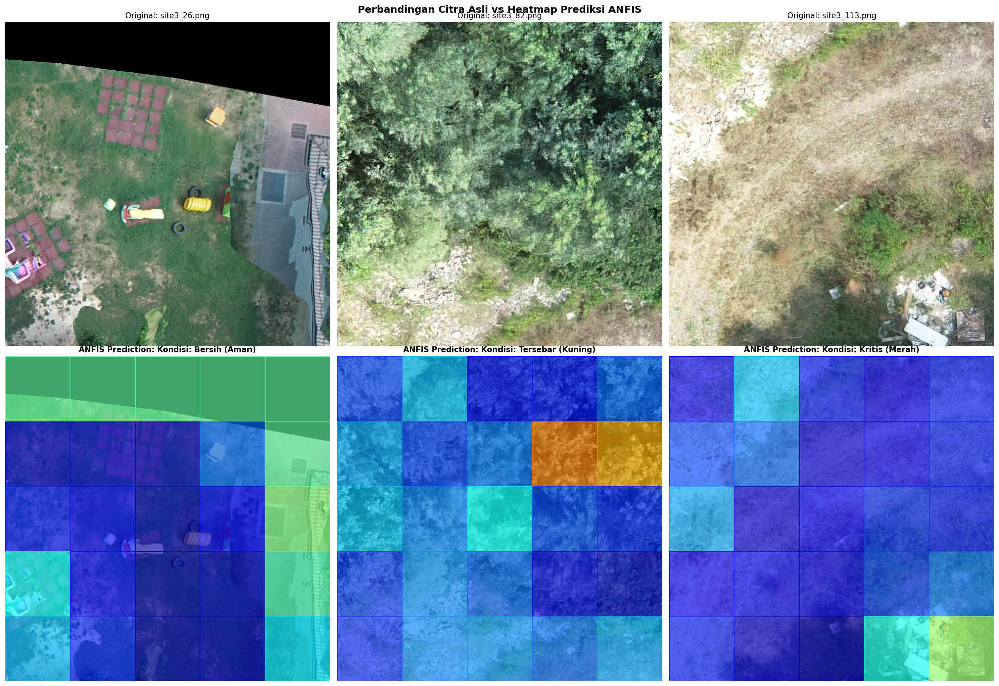

In [71]:
def get_img_id_by_class(target_class, df):
    sample_grid = df[df['Y_Target'] == target_class].iloc[0]['Grid_ID']
    # Grid ID extraction
    parts = sample_grid.split('_X')
    filename = parts[0] + '.png' if not parts[0].endswith('.png') else parts[0]
    for img_id, info in coco_api.imgs.items():
        if info['file_name'] == filename:
            return img_id, filename
    return None, None

# 1. Cari sampel
clean_id, clean_fn = get_img_id_by_class(0, df_raw)
scattered_id, scattered_fn = get_img_id_by_class(1, df_raw)
critical_id, critical_fn = get_img_id_by_class(2, df_raw)

test_cases = [
    (clean_id, clean_fn, "Kondisi: Bersih (Aman)"),
    (scattered_id, scattered_fn, "Kondisi: Tersebar (Kuning)"),
    (critical_id, critical_fn, "Kondisi: Kritis (Merah)")
]

# 2. Visualisasi
fig, axes = plt.subplots(2, 3, figsize=(20, 14))

for i, (img_id, img_fn, label) in enumerate(test_cases):
    if img_id is not None:
        img_path = os.path.join(IMAGE_DIR, img_fn)
        img_asli = cv2.imread(img_path)
        img_asli = cv2.cvtColor(img_asli, cv2.COLOR_BGR2RGB)

        # Citra asli
        axes[0, i].imshow(img_asli)
        axes[0, i].set_title(f"Original: {img_fn}", fontsize=11)
        axes[0, i].axis('off')

        # Heatmap
        img_heatmap, pred_map = buat_peta_panas_anfis(img_asli, loaded_anfis, loaded_scaler)
        axes[1, i].imshow(img_heatmap)
        axes[1, i].set_title(f"ANFIS Prediction: {label}", fontsize=11, fontweight='bold')
        axes[1, i].axis('off')

plt.suptitle("Perbandingan Citra Asli vs Heatmap Prediksi ANFIS", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


### Inference on External Images


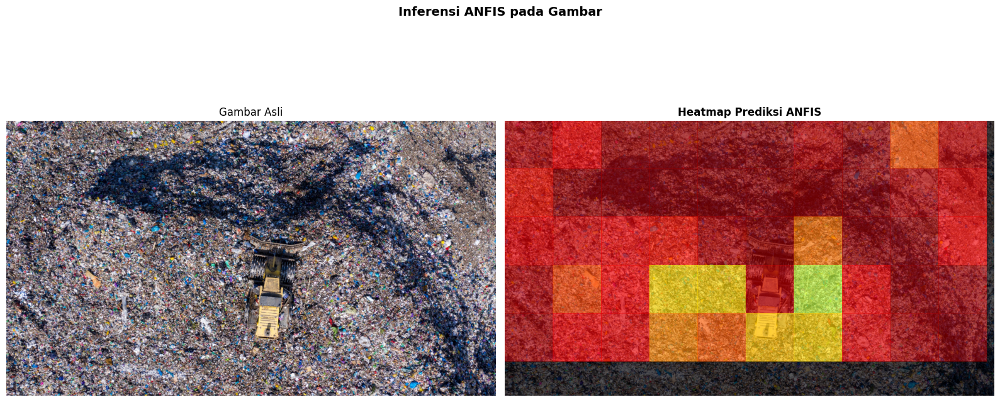

Kelas Aman: 0.0%
Kelas Tersebar: 0.0%
Kelas Kritis: 100.0%


In [72]:
EXTERNAL_IMAGE_PATH = os.path.join(PROJECT_ROOT, "TPSA.jpg")

img_ext_bgr = cv2.imread(EXTERNAL_IMAGE_PATH)
img_ext_rgb = cv2.cvtColor(img_ext_bgr, cv2.COLOR_BGR2RGB)

# Heatmap
img_heatmap_ext, pred_map_ext = buat_peta_panas_anfis(
    img_ext_rgb, loaded_anfis, loaded_scaler, grid_size=128
)

plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
plt.imshow(img_ext_rgb)
plt.title("Gambar Asli", fontsize=12)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_heatmap_ext)
plt.title("Heatmap Prediksi ANFIS", fontsize=12, fontweight='bold')
plt.axis('off')

plt.suptitle("Inferensi ANFIS pada Gambar",
                fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Statistik
valid_preds = pred_map_ext[pred_map_ext >= 0]
if len(valid_preds) > 0:
    for cls in range(NUM_CLASSES):
        count = np.sum(valid_preds == cls)
        pct = count / len(valid_preds) * 100
        nama = {0: "Aman", 1: "Tersebar", 2: "Kritis"}[cls]
        print(f"Kelas {nama}: {pct:.1f}%")
